In [16]:
#inspired from fastai's stable diffusion deep dive lecture:
# https://course.fast.ai/Lessons/lesson9.html

In [17]:
import gc
gc.collect()

import os
from dotenv import load_dotenv

# Load the environment variables from the .env file
# Loads the HF_TOKEN into the environment, for accessing HuggingFace
load_dotenv()

# If your environment already has the HF_TOKEN key loaded, the above step can be ignored

True

In [18]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)


#if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

In [19]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", variant="fp16", torch_dtype=torch.float16).to("mps")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [20]:
!ls ~/.cache/huggingface/hub

models--CompVis--stable-diffusion-v1-4
models--deepset--roberta-base-squad2
models--distilbert-base-uncased-finetuned-sst-2-english
models--facebook--detr-resnet-50
models--microsoft--markuplm-base
models--microsoft--markuplm-base-finetuned-websrc
models--timm--resnet50.a1_in1k
version.txt
version_diffusers_cache.txt


In [22]:
prompt = "a photograph of an astronaut riding a horse"

  0%|          | 0/50 [00:00<?, ?it/s]

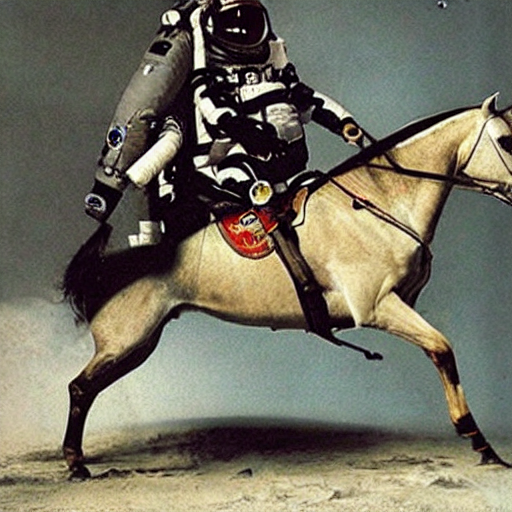

In [26]:
torch.manual_seed(1)
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

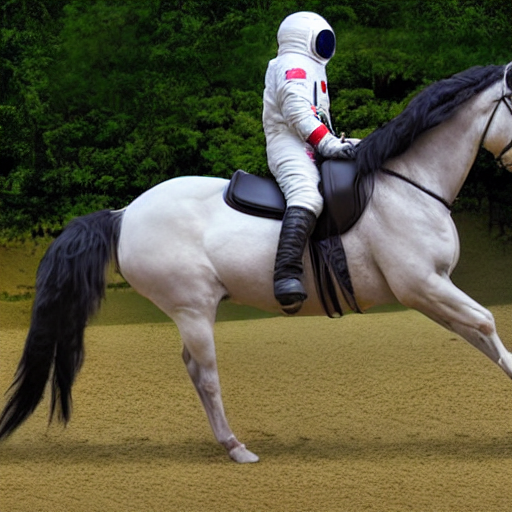

In [27]:
torch.manual_seed(1024)
pipe(prompt).images[0]

  0%|          | 0/5 [00:00<?, ?it/s]

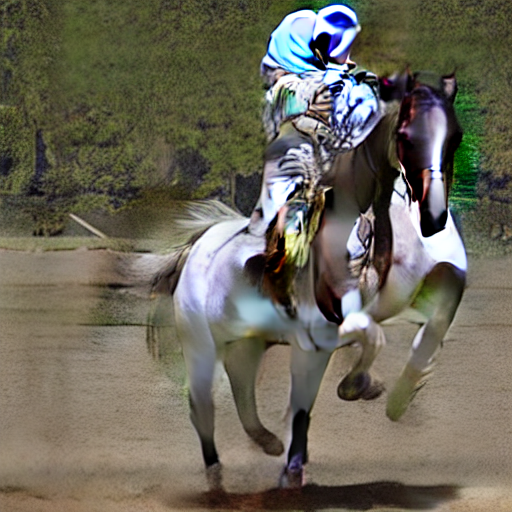

In [30]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=5).images[0]

# Classifier-Free Guidance

In [31]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [32]:
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols

In [33]:
#Takes abot 5m to run on a Macbook M1 Max chip
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1,3,7,14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

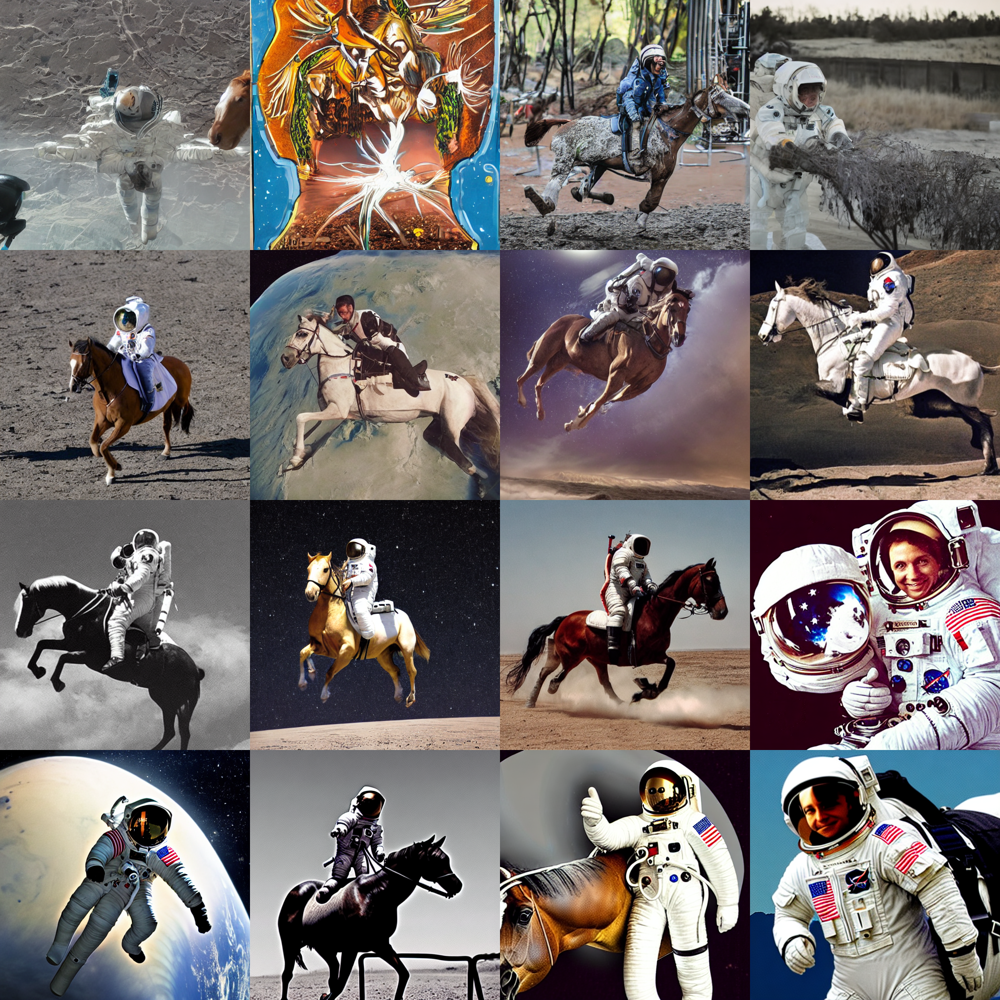

In [34]:
image_grid(images, rows=num_rows, cols=num_cols)

In [36]:
gc.collect()

0